# myDecisionTreeCalssifier

## Навигация

1. [Эксперимент с построением дерева с одним признаком возрастом](#Эксперимент-с-построением-дерева-с-одним-признаком-возрастом)
   - [Моё дерево](#Моё-дерево)
   - [Дерево из sklearn](#Дерево-из-sklearn)
2. [Переобученная модель дерева решений](#Переобученная-модель-дерева-решений)
3. [Обобщающая модель дерева решений](#Обобщающая-модель-дерева-решений)
4. [Feature importances](#Feature-importances)

In [1]:
import os
import sys
sys.path.append('..')
import subprocess

from IPython import display
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz

import src

In [3]:
data = pd.read_csv(src.constants.ENCODED_DATA_PATH)
data.head()

,2. Возраст,3. Семейное положение,"4. Если имеете супруга или партнера, как долго вы живете вместе (в годах)?",5. В какой семье Вы выросли?,6. Жив ли хотя бы один из Ваших родителей (да/нет)?,"7. Если да, как часто вы общаетесь?",8. Есть ли у Вас дети (да/нет)?,"9. Если да, сколько?",10. Есть ли у Вас совершеннолетние дети (да/нет)?,"11. Если да, как часто вы общаетесь?",12. Сколько человек живут вместе с Вами?,13. Каковы Ваши взаимоотношения с соседями?,14. Как часто Вы встречаетесь с друзьями?,15. Есть ли у Вас домашние питомцы (да/нет)?,"16. В течение последних 7 дней, как часто Вы практиковали тяжелые физические нагрузки?","17. В течение последних 7 дней, как часто Вы практиковали умеренные физические нагрузки?","18. В течение последних 7 дней, как часто Вы ходили пешком минимум 10 минут без перерыва?",19. Уровень Вашего образования?,20. Каков уровень образования Вашего партнера (если применимо)?,22. Как долго Вы проживаете в этом месте (в годах)?,23. Каков тип Вашего дома?,"24. Если Вы живете в многоквартирном доме, то на каком этаже?",25. Каким транспортом Вы обычно пользуетесь?,26. Сколько времени занимает Ваш путь до работы в одну сторону?,27. Каков тип Вашей занятости?,28. Каковы Ваши предпочтения в пище?,29. Каков тип Вашего питания?,30. Вы курите (да/нет)?,31. Количество родов,32. Количество прерванных беременностей,33. Гинекологические заболевания (да/нет),34. Заболевания щитовидной железы (да/нет),35. Наследственность (да/нет),Метка
0,46.515068,имею гражданского супруга,21.0,"полная семья, кровные родители",да,каждый день или почти каждый день,да,1.0,да,я живу с моими взрослыми детьми,2-3 человека,хорошие,раз в неделю,да,NaN,NaN,7.0,среднее специальное образование,среднее специальное образование,7.0,многоквартирный дом,12.0,общественный транспорт,NaN,я не работаю,я ем мясо или рыбу ежедневно,3-4-разовое домашнее питание,нет,1,0,да,нет,нет,норма
1,45.983562,разведена,NaN,"полная семья, кровные родители",да,раз в неделю,да,1.0,да,каждый день или почти каждый день,я живу одна,"очень хорошие, дружеские",раз в месяц,да,4.0,4.0,7.0,среднее специальное образование,NaN,11.0,многоквартирный дом,5.0,общественный транспорт,1-3 часа,полный рабочий день,я ем мясо или рыбу 2-3 раза в неделю,"дома готовлю редко, питаюсь в предприятиях общ...",нет,1,0,да,нет,нет,норма
2,35.443836,замужем,11.0,"полная семья, кровные родители",да,раз в неделю,да,1.0,нет,NaN,2-3 человека,хорошие,раз в неделю,да,1.0,3.0,7.0,законченное высшее образование,законченное высшее образование,34.0,многоквартирный дом,3.0,общественный транспорт,1 час и меньше,я работаю из дома,я ем мясо или рыбу ежедневно,"3-разовое питание, домашнее и в предприятиях о...",да,1,2,нет,нет,нет,норма
3,53.539726,разведена,NaN,"полная семья, кровные родители",да,каждый день или почти каждый день,да,2.0,да,каждый день или почти каждый день,2-3 человека,"очень хорошие, дружеские","реже, чем раз в месяц",да,0.0,0.0,7.0,законченное высшее образование,средняя школа,50.0,многоквартирный дом,5.0,общественный транспорт,1-3 часа,полный рабочий день,я ем мясо или рыбу ежедневно,3-4-разовое домашнее питание,да,2,5,нет,нет,нет,норма
4,44.115068,замужем,12.0,"полная семья, кровные родители",да,каждый день или почти каждый день,да,1.0,да,я живу с моими взрослыми детьми,2-3 человека,хорошие,"реже, чем раз в месяц",нет,5.0,0.0,7.0,средняя школа,законченное высшее образование,4.0,многоквартирный дом,4.0,я обычно не пользуюсь транспортом,1 час и меньше,полный рабочий день,я ем мясо или рыбу 2-3 раза в неделю,3-4-разовое домашнее питание,нет,1,2,да,нет,нет,норма


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 595 entries, 0 to 594
Data columns (total 34 columns):
 #   Column                                                                                     Non-Null Count  Dtype  
---  ------                                                                                     --------------  -----  
 0   2. Возраст                                                                                 593 non-null    float64
 1   3. Семейное положение                                                                      595 non-null    object 
 2   4. Если имеете супруга или партнера, как долго вы живете вместе (в годах)?                 345 non-null    float64
 3   5. В какой семье Вы выросли?                                                               594 non-null    object 
 4   6. Жив ли хотя бы один из Ваших родителей (да/нет)?                                        595 non-null    object 
 5   7. Если да, как часто вы общаетесь?               

In [5]:
y = data[src.constants.TARGET]
X = data.drop(columns=src.constants.TARGET)

## Эксперимент с построением дерева с одним признаком возрастом

[Навигация](#Навигация)

### Моё дерево

[Навигация](#Навигация)

In [6]:
notna_mask = X[src.constants.QUESTION_2].notna()
X_age = pd.DataFrame(X.loc[notna_mask, src.constants.QUESTION_2])
y_age = y[notna_mask]

In [7]:
my_tree = src.my_decision_tree.MyDecisionTreeClassifier()
my_tree.fit(
    X_age, y_age,
    numerical_feature_names=[src.constants.QUESTION_2],
)

filename = os.path.join('..', 'reports', 'figures', 'MyDecisionTreeClassifier one numerical feature.gv')
my_tree.render(
    rounded=True,
    show_impurity=True,
    show_num_samples=True,
    show_distribution=True,
    show_label=True,
    filename=filename,
    format='png',
)
display.Image(f'{filename}.png')

### Дерево из sklearn

[Навигация](#Навигация)

In [8]:
sklearn_tree = DecisionTreeClassifier()
sklearn_tree.fit(X_age, y_age)

DecisionTreeClassifier()

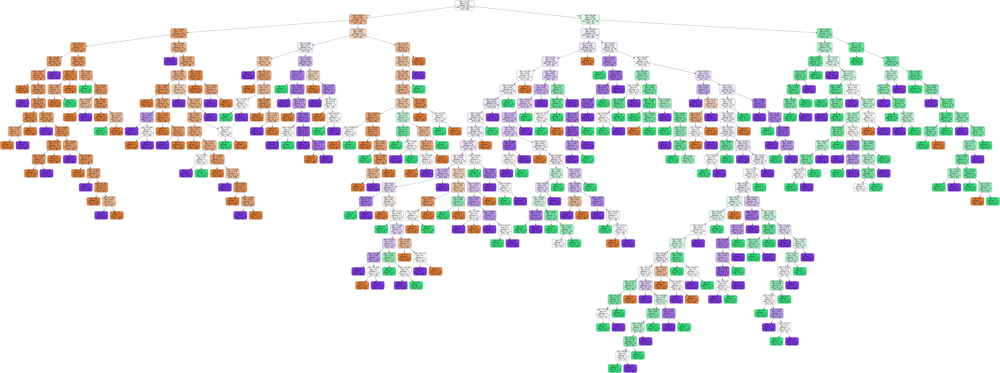

In [9]:
filename_gv = os.path.join('..', 'reports', 'figures', 'sklearn DecisionTreeClassifier one numerical feature.gv')
filename_png = os.path.join('..', 'reports', 'figures', 'sklearn DecisionTreeClassifier one numerical feature.png')
export_graphviz(
    sklearn_tree,
    out_file=filename_gv,
    class_names=True,
    filled=True,
    rounded=True,
)
# конвертируем из .gv в .png через командую строку
subprocess.call(['dot', '-Tpng', f'{filename_gv}', '-o', f'{filename_png}'])
display.Image(filename_png)

## Переобученная модель дерева решений

[Навигация](#Навигация)

In [10]:
overfitted_tree = src.my_decision_tree.MyDecisionTreeClassifier()
overfitted_tree.fit(
    X, y,
    categorical_feature_names=src.constants.CATEGORICAL_FEATURES | src.constants.BINARY_FEATURES,
    rank_feature_names=src.constants.RANK_FEATURES,
    numerical_feature_names=src.constants.NUMERICAL_FEATURES,
)

filename = os.path.join('..', 'reports', 'figures', 'MyDecisionTreeClassifier overfitted.gv')
overfitted_tree.render(
    rounded=True,
    show_impurity=True,
    show_num_samples=True,
    show_distribution=True,
    show_label=True,
    filename=filename,
    format='png',
)
display.Image(f'{filename}.png')

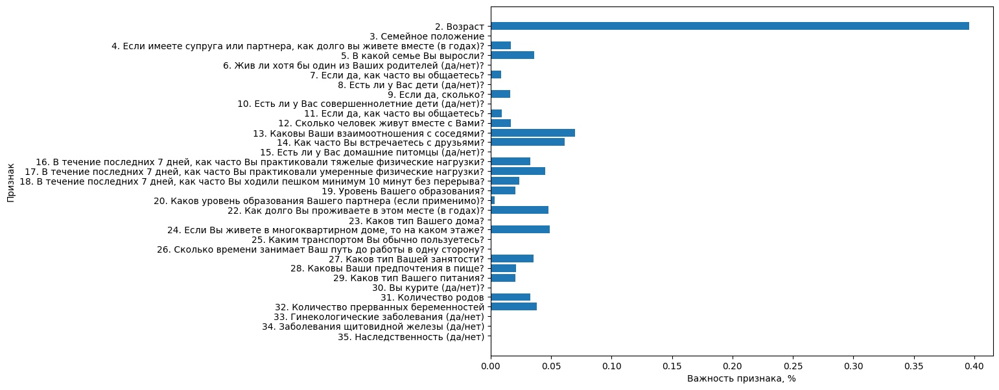

In [12]:
features = list(overfitted_tree.feature_importances.keys())
importances = overfitted_tree.feature_importances.values()

fig, ax = plt.subplots(figsize=(10, 7))

ax.barh(list(reversed(features)), list(reversed(importances)), align='center')
ax.set(xlabel='Важность признака, %', ylabel='Признак')

plt.savefig(os.path.join('..', 'reports', 'figures', 'MyDecisionTreeClassifier overfitted feature_importances.png'))
plt.show()

## Обобщающая модель дерева решений

[Навигация](#Навигация)

In [13]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=src.constants.RANDOM_STATE)

Кросс-валидации гиперпараметров.

In [15]:
%%time

search = GridSearchCV(
    estimator=src.my_decision_tree.MyDecisionTreeClassifier(),
    param_grid=[
        {
            'min_samples_split': [2],
            'min_samples_leaf': [1],
        },
        {
            'min_samples_split': [4],
            'min_samples_leaf': [1, 2],
        },
        {
            'min_samples_split': [8],
            'min_samples_leaf': [1, 2, 4],
        },
        {
            'min_samples_split': [16],
            'min_samples_leaf': [1, 2, 4, 8],
        },
        {
            'min_samples_split': [32],
            'min_samples_leaf': [1, 2, 4, 8, 16],
        },
        {
            'min_samples_split': [64],
            'min_samples_leaf': [1, 2, 4, 8, 16, 32],
        },
        {
            'min_samples_split': [128],
            'min_samples_leaf': [1, 2, 4, 8, 16, 32, 64],
        },
        {
            'min_samples_split': [256],
            'min_samples_leaf': [1, 2, 4, 8, 16, 32, 64, 128],
        },
        {
            'min_samples_split': [512],
            'min_samples_leaf': [1, 2, 4, 8, 16, 32, 64, 128, 256],
        },
    ],
    cv=StratifiedShuffleSplit(n_splits=5, random_state=src.constants.RANDOM_STATE),
)

fit_params = {
    'categorical_feature_names': src.constants.CATEGORICAL_FEATURES | src.constants.BINARY_FEATURES,
    'rank_feature_names': src.constants.RANK_FEATURES,
    'numerical_feature_names': src.constants.NUMERICAL_FEATURES,
}
search.fit(X_train, y_train, **fit_params)

CPU times: total: 12h 53min 47s
Wall time: 13h 15min 7s


GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=42, test_size=None,
            train_size=None),
             estimator=<src.my_decision_tree.MyDecisionTreeClassifier object at 0x00000258B9B3FA90>,
             param_grid=[{'min_samples_leaf': [1], 'min_samples_split': [2]},
                         {'min_samples_leaf': [1, 2], 'min_samples_split': [4]},
                         {'min_samples_leaf': [1, 2, 4],
                          'min_samples_split': [8]},
                         {'m...
                          'min_samples_split': [16]},
                         {'min_samples_leaf': [1, 2, 4, 8, 16],
                          'min_samples_split': [32]},
                         {'min_samples_leaf': [1, 2, 4, 8, 16, 32],
                          'min_samples_split': [64]},
                         {'min_samples_leaf': [1, 2, 4, 8, 16, 32, 64],
                          'min_samples_split': [128]},
                         {'min_samples_leaf': [1, 2, 4, 8, 16, 32, 64, 128],
                          'min_samples_split': [256]},
                         {'min_samples_leaf': [1, 2, 4, 8, 16, 32, 64, 128,
                                               256],
                          'min_samples_split': [512]}])

In [17]:
print('Лучшие гиперпараметры:')
for hyperparam, value in search.best_params_.items():
    print(f'* {hyperparam}: {value}')
print(f'Лучший mean Accuracy: {search.best_score_}')

Лучшие гиперпараметры:
* min_samples_leaf: 1
* min_samples_split: 2
Лучший mean Accuracy: 0.5466666666666666


In [18]:
generalizing_tree = search.best_estimator_
y_pred = generalizing_tree.predict(X_test)
print(classification_report(y_test, y_pred, zero_division=0))

                           precision    recall  f1-score   support

доброкачественная опухоль       0.62      0.74      0.67        50
  злокачественная опухоль       0.57      0.40      0.47        50
                    норма       0.43      0.47      0.45        49

                 accuracy                           0.54       149
                macro avg       0.54      0.54      0.53       149
             weighted avg       0.54      0.54      0.53       149



In [19]:
filename = os.path.join('..', 'reports', 'figures', 'MyDecisionTreeClassifier generalizing.gv')
generalizing_tree.render(
    rounded=True,
    # show_impurity=True,
    # show_num_samples=True,
    # show_distribution=True,
    show_label=True,
    filename=filename,
    format='png',
)
display.Image(f'{filename}.png')

## Feature importances

[Навигация](#Навигация)

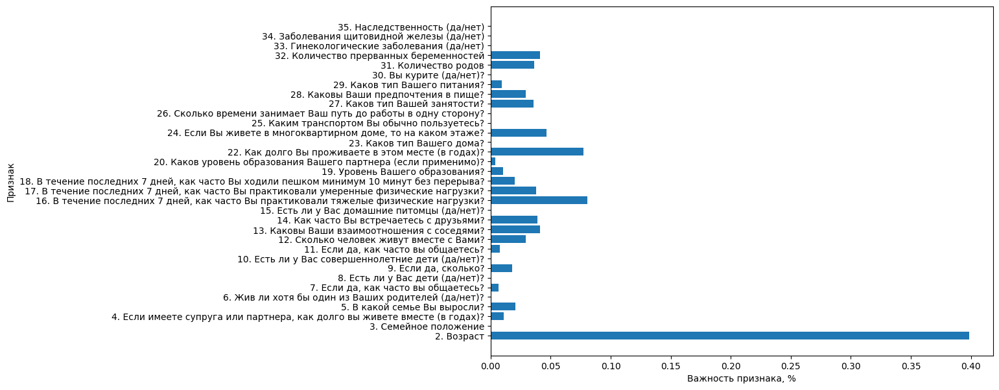

In [20]:
features = list(generalizing_tree.feature_importances.keys())
importances = generalizing_tree.feature_importances.values()

fig, ax = plt.subplots(figsize=(10, 7))
ax.barh(features, importances, align='center')
ax.set(xlabel='Важность признака, %', ylabel='Признак')

plt.show()